# Сборный проект-5

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [1]:
# Основные библиотеки
import os
import numpy as np
import pandas as pd

# Для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

# Для обработки изображений
from PIL import Image
from torchvision import models, transforms
import torch

# Для обработки текстов
from transformers import DistilBertTokenizer, DistilBertModel

# Для работы с машинным обучением
from sklearn.model_selection import GroupShuffleSplit
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch.nn.functional import cosine_similarity
from sklearn.metrics import mean_absolute_error

# Для фильтрации текста
import re 
import random
from deep_translator import GoogleTranslator

# Для глубокого обучения
import torch.nn as nn
import torch.optim as optim

# Для прогресса выполнения
from tqdm import tqdm
import time


In [2]:
# Загрузка данных с указанием имен столбцов
train_dataset = pd.read_csv('train_dataset.csv')

crowd_annotations = pd.read_csv(
    'CrowdAnnotations.tsv',
    sep='\t',
    header=None,
    names=['image', 'query_id', 'ratio_agree', 'count_agree', 'count_disagree']
)

expert_annotations = pd.read_csv(
    'ExpertAnnotations.tsv',
    sep='\t',
    header=None,
    names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']
)

# Просмотр первых нескольких строк каждого файла
train_dataset.info()
display(train_dataset.head())
crowd_annotations.info()
display(crowd_annotations.head(10))
expert_annotations.info()
display(expert_annotations.head(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   ratio_agree     47830 non-null  float64
 3   count_agree     47830 non-null  int64  
 4   count_disagree  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,ratio_agree,count_agree,count_disagree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


In [3]:
# Объединение таблиц
merged_data = pd.merge(crowd_annotations, expert_annotations, on=['image', 'query_id'], how='right')
merged_data = pd.merge(merged_data, train_dataset, on=['image', 'query_id'], how='right')
# Исключаем строки, где отсутствуют экспертные оценки
filtered_data = merged_data.dropna(subset=['expert_1', 'expert_2', 'expert_3']).copy()
# Результат
filtered_data.info()
display(filtered_data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           5822 non-null   object 
 1   query_id        5822 non-null   object 
 2   ratio_agree     2329 non-null   float64
 3   count_agree     2329 non-null   float64
 4   count_disagree  2329 non-null   float64
 5   expert_1        5822 non-null   int64  
 6   expert_2        5822 non-null   int64  
 7   expert_3        5822 non-null   int64  
 8   query_text      5822 non-null   object 
dtypes: float64(3), int64(3), object(3)
memory usage: 409.5+ KB


,image,query_id,ratio_agree,count_agree,count_disagree,expert_1,expert_2,expert_3,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0,3.0,1,1,1,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,NaN,NaN,NaN,1,1,1,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0,3.0,1,2,2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,1.0,3.0,0.0,4,4,4,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,NaN,NaN,NaN,1,1,1,A young child is wearing blue goggles and sitt...


In [4]:
# Вычисление средней оценки
filtered_data['average_score'] = filtered_data[['expert_1', 'expert_2', 'expert_3']].mean(axis=1)

# Преобразование средней оценки в диапазон [0, 1]
filtered_data['target'] = (filtered_data['average_score'] - 1) / 3

# Проверка на уникальность оценок
filtered_data['unique_scores'] = filtered_data[['expert_1', 'expert_2', 'expert_3']].nunique(axis=1)

# Исключение строк, где все три оценки уникальны
filtered_data = filtered_data[filtered_data['unique_scores'] < 3]

# Удаление временного столбца
filtered_data.drop(columns=['unique_scores'], inplace=True)

# Проверка результата
display(filtered_data[['image', 'query_id', 'expert_1', 'expert_2', 'expert_3', 'target']].head())

,image,query_id,expert_1,expert_2,expert_3,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,1,2,2,0.222222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,4,4,4,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000


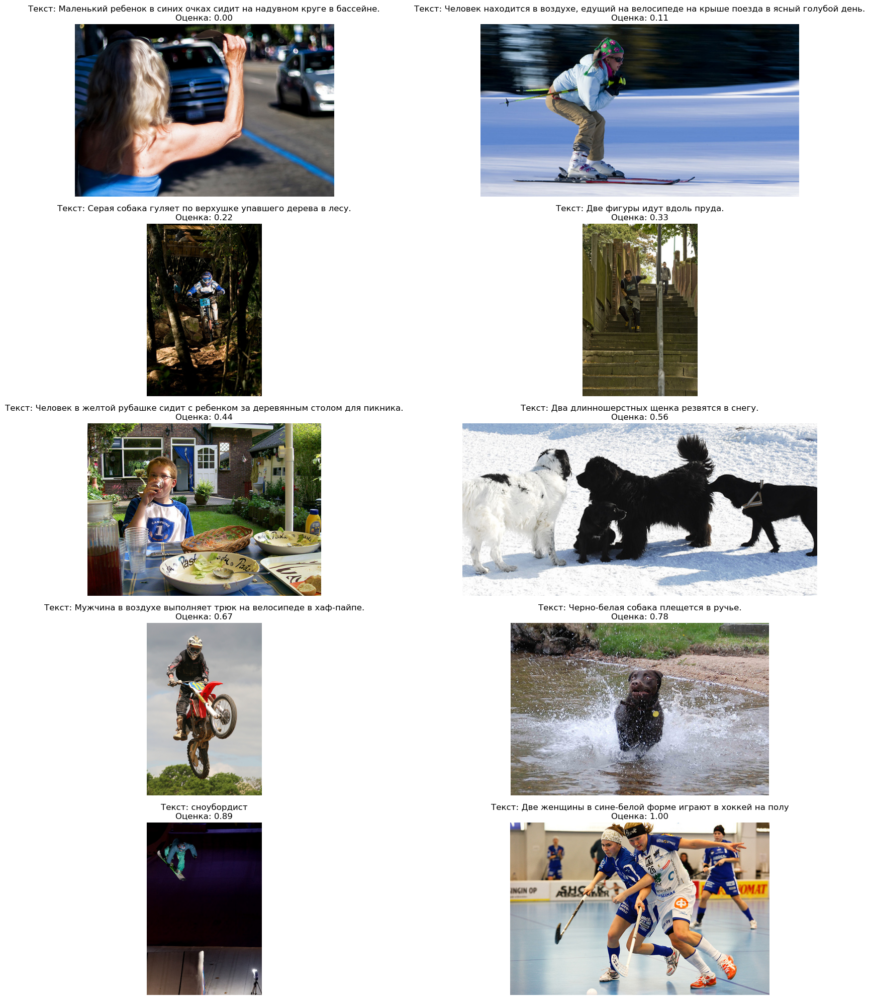

In [5]:
# Функция для перевода текста с английского на русский
def translate_text(text, source_lang='en', target_lang='ru'):
    return GoogleTranslator(source=source_lang, target=target_lang).translate(text)

# Функция для оборачивания текста
def wrap_text(text, max_length=100):
    """ Разбиваем текст на строки с ограниченной длиной """
    words = text.split()
    lines = []
    current_line = ""
    
    for word in words:
        if len(current_line + " " + word) <= max_length:
            current_line += " " + word if current_line else word
        else:
            lines.append(current_line)
            current_line = word
    
    if current_line:
        lines.append(current_line)
    
    return "\n".join(lines)

# Функция для отображения изображений с уникальными оценками
def display_unique_score_images_sorted(dataset, image_folder, max_text_length=100):
    # Удаляем дубликаты по целевой переменной (target) и сортируем по возрастанию
    unique_samples = dataset.sort_values(by='target').drop_duplicates(subset='target', keep='first')
    
    # Настроим отображение изображений в сетке (по 2 изображения в ряду)
    n_samples = len(unique_samples)
    fig, axes = plt.subplots((n_samples + 1) // 2, 2, figsize=(20, n_samples * 2))  # 2 изображения в ряду
    axes = axes.flatten()
    
    # Выводим информацию о уникальных образцах
    for idx, (index, row) in enumerate(unique_samples.iterrows()):
        # Путь к изображению
        image_path = os.path.join(image_folder, row['image'])
        
        # Перевод текста
        translated_text = translate_text(row['query_text'])
        
        # Оборачиваем текст
        wrapped_text = wrap_text(translated_text, max_length=max_text_length)
        
        # Открытие изображения с помощью PIL
        img = Image.open(image_path)
        
        # Отображение изображения
        axes[idx].imshow(img)
        axes[idx].axis('off')  # Скрыть оси
        
        # Вывод информации на изображении
        axes[idx].set_title(f"Текст: {wrapped_text}\nОценка: {row['target']:.2f}")
    
    # Удаляем лишние пустые графики, если их больше, чем данных
    for idx in range(len(unique_samples), len(axes)):
        axes[idx].axis('off')
    
    # Показать все изображения
    plt.tight_layout()
    plt.show()

# Пример использования
image_folder = 'train_images'  # Папка с изображениями
# Вызов функции для отображения изображений с уникальными оценками
display_unique_score_images_sorted(filtered_data, image_folder, max_text_length=100)

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Количество запрещённых изображений: 85
Примеры запрещённых изображений:


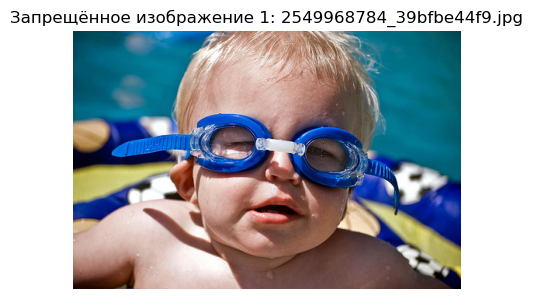

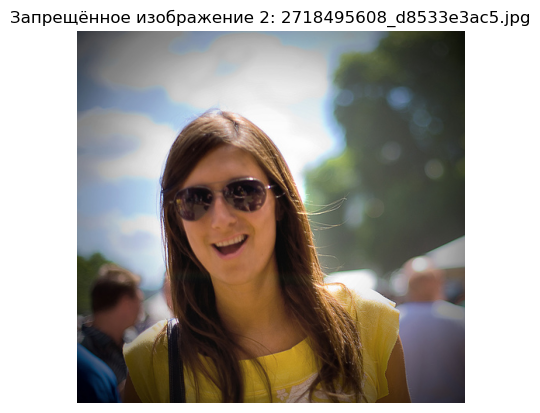

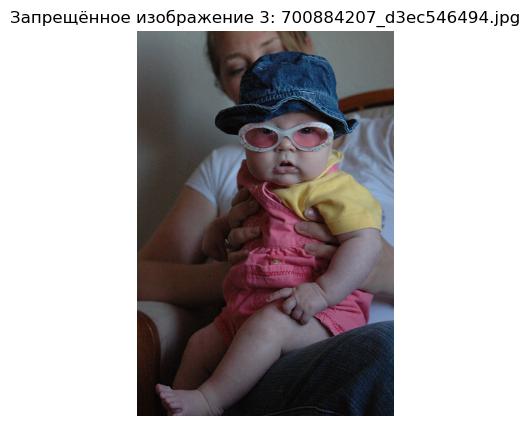

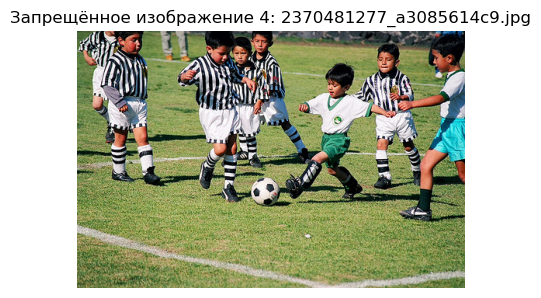

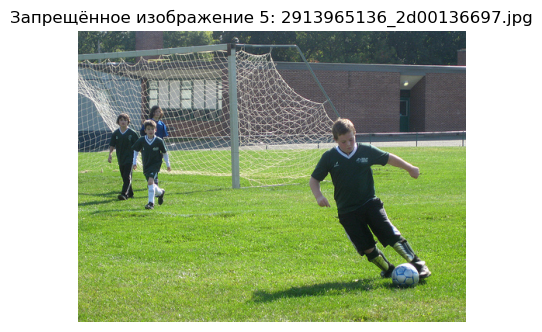

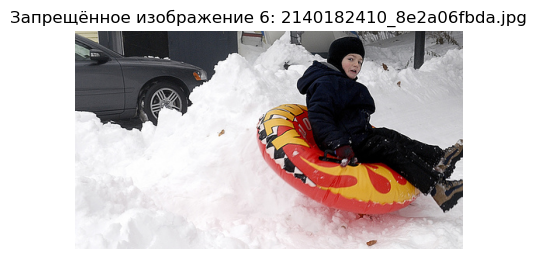

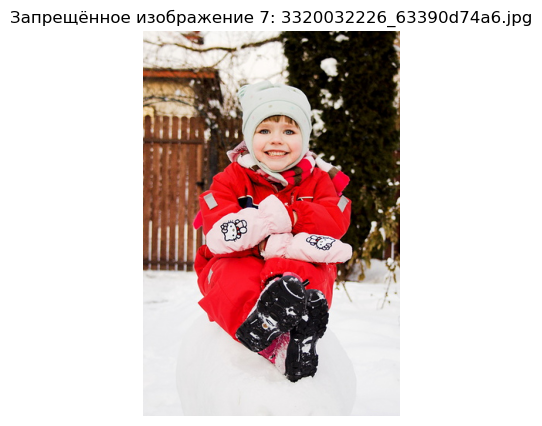

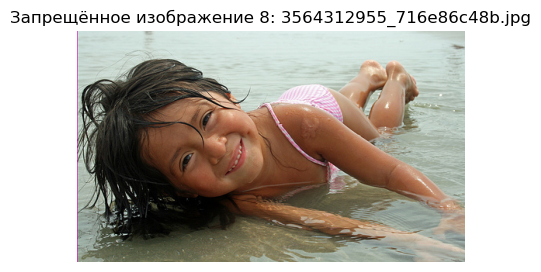

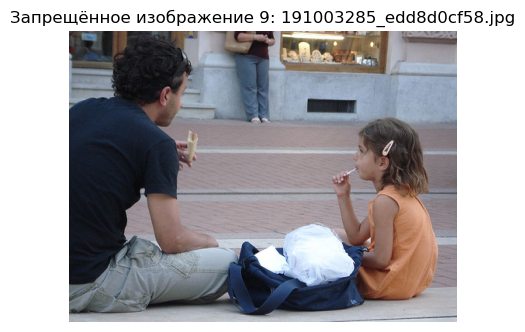

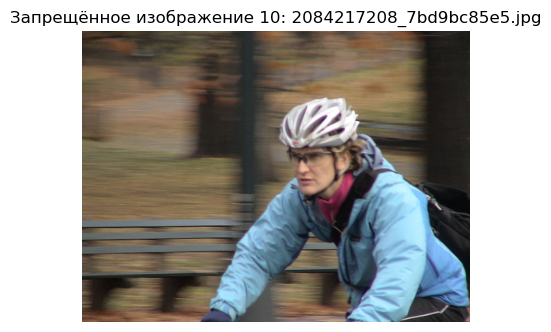

Размер данных после фильтрации: (5220, 11)


,image,query_id,ratio_agree,count_agree,count_disagree,expert_1,expert_2,expert_3,query_text,average_score,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0,3.0,1,1,1,A young child is wearing blue goggles and sitt...,1.000000,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,NaN,NaN,NaN,1,1,1,A young child is wearing blue goggles and sitt...,1.000000,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0,3.0,1,2,2,A young child is wearing blue goggles and sitt...,1.666667,0.222222
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,NaN,NaN,NaN,1,1,1,A young child is wearing blue goggles and sitt...,1.000000,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0,3.0,2,2,3,A young child is wearing blue goggles and sitt...,2.333333,0.444444


<class 'pandas.core.frame.DataFrame'>
Index: 5220 entries, 0 to 5820
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           5220 non-null   object 
 1   query_id        5220 non-null   object 
 2   ratio_agree     2011 non-null   float64
 3   count_agree     2011 non-null   float64
 4   count_disagree  2011 non-null   float64
 5   expert_1        5220 non-null   int64  
 6   expert_2        5220 non-null   int64  
 7   expert_3        5220 non-null   int64  
 8   query_text      5220 non-null   object 
 9   average_score   5220 non-null   float64
 10  target          5220 non-null   float64
dtypes: float64(5), int64(3), object(3)
memory usage: 489.4+ KB


In [6]:
# Расширенный список ключевых слов и фраз, связанных с детьми
keywords_extended = [
    "child", "kid", "baby", "boy", "girl", "teen", "infant", "toddler",
    "newborn", "youngster", "juvenile", "adolescent", "minor",
    "baby's", "child's", "kid's", "infant's", "toddler's", "youngster's",
    "baby face", "child face", "kid face", "infant face", "toddler face",
    "little boy", "little girl", "small child", "young child",
    "playing child", "playing children", "children",
    "boy playing", "girl playing", "kids playing",
    "baby playing", "child playing"
]

# Создаём регулярное выражение для улучшенного списка запрещённых слов
keyword_pattern_extended = re.compile(r'\b(?:' + '|'.join(keywords_extended) + r')\b', re.IGNORECASE)

# Функция для проверки текста на наличие запрещённых слов
def contains_keywords(text, pattern):
    return bool(pattern.search(text))

# Добавляем временный столбец для проверки запрещённых слов
filtered_data['contains_banned_words'] = filtered_data['query_text'].apply(
    lambda x: contains_keywords(x, keyword_pattern_extended)
)

# Находим все изображения, которые нужно исключить
banned_images = filtered_data.loc[
    filtered_data['contains_banned_words'] & (filtered_data['target'] > 0.5), 
    'image'
].unique()

print(f"Количество запрещённых изображений: {len(banned_images)}")

# Выводим примеры запрещённых изображений
print("Примеры запрещённых изображений:")
for i, image_name in enumerate(banned_images[:10]):
    image_path = os.path.join(image_folder, image_name)
    if os.path.exists(image_path):
        img = plt.imread(image_path)
        plt.figure(figsize=(5, 5))
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Запрещённое изображение {i + 1}: {image_name}")
        plt.show()
    else:
        print(f"Изображение {image_name} не найдено в {image_folder}.")

# Удаляем строки, связанные с запрещёнными изображениями
filtered_data = filtered_data[~filtered_data['image'].isin(banned_images)]

# Удаляем временный столбец
filtered_train_dataset = filtered_data.drop(columns=['contains_banned_words'])

# Проверяем результат
print(f"Размер данных после фильтрации: {filtered_train_dataset.shape}")
display(filtered_train_dataset.head())
filtered_train_dataset.info()

In [7]:
# Удаляем ненужные столбцы
columns_to_drop = [
    'ratio_agree', 'count_agree', 'count_disagree',
    'expert_1', 'expert_2', 'expert_3', 'average_score'
]

filtered_train_dataset = filtered_train_dataset.drop(columns=columns_to_drop)

# Проверяем результат
print(f"Размер данных после удаления столбцов: {filtered_train_dataset.shape}")
display(filtered_train_dataset.head())
filtered_train_dataset.info()

Размер данных после удаления столбцов: (5220, 4)


,image,query_id,query_text,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.222222
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.444444


<class 'pandas.core.frame.DataFrame'>
Index: 5220 entries, 0 to 5820
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5220 non-null   object 
 1   query_id    5220 non-null   object 
 2   query_text  5220 non-null   object 
 3   target      5220 non-null   float64
dtypes: float64(1), object(3)
memory usage: 203.9+ KB


## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
# Определение устройства (GPU или CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def extract_image_features(image_folder, model=None, device=None):
    """
    Извлечение признаков изображений с использованием предобученной модели ResNet-18.
    Args:
        image_folder (str): Путь к папке с изображениями.
        model (torch.nn.Module, optional): Предобученная модель для извлечения признаков.
            Если None, будет использована ResNet-18.
        device (torch.device, optional): Устройство для вычислений (GPU или CPU).
            Если None, будет выбрано автоматически.
    Returns:
        pd.DataFrame: DataFrame с именами изображений и их эмбеддингами.
    """
    # Определение устройства
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Загрузка предобученной модели ResNet-18
    if model is None:
        weights = models.ResNet18_Weights.IMAGENET1K_V1  # Явное указание весов
        model = models.resnet18(weights=weights)
        model = model.to(device)
        model.eval()
    
    # Удаление верхнего классификационного слоя
    model = torch.nn.Sequential(*(list(model.children())[:-1]))
    
    # Преобразование изображений без аугментации
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Изменение размера до 224x224
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Нормализация
    ])
    
    # Создание списка для хранения результатов
    image_vectors = []
    
    # Обработка изображений и извлечение признаков
    for image_name in tqdm(os.listdir(image_folder), desc="Векторизация изображений"):
        image_path = os.path.join(image_folder, image_name)
        try:
            # Загрузка и преобразование изображения
            img = Image.open(image_path).convert("RGB")
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            # Извлечение признаков с помощью ResNet-18
            with torch.no_grad():
                features = model(img_tensor)
                features = features.cpu().numpy().flatten()  # Преобразование в одномерный вектор
            
            # Сохранение имени изображения и вектора признаков
            image_vectors.append({"image": image_name, "image_vector": features})
        except Exception as e:
            print(f"Ошибка при обработке {image_name}: {e}")
    
    # Преобразование списка в DataFrame
    df_image_vectors = pd.DataFrame(image_vectors)
    print("Векторизация изображений завершена")
    
    return df_image_vectors

# Пример использования функции
if __name__ == "__main__":
    # Путь к папке с изображениями
    image_folder = "train_images"
    
    # Извлечение признаков
    df_image_vectors = extract_image_features(image_folder)
    
    # Вывод первых строк DataFrame
    display(df_image_vectors.head())

Векторизация изображений: 100%|████████████████████████████████████████████████████| 1000/1000 [00:12<00:00, 79.11it/s]

Векторизация изображений завершена


,image,image_vector
0,1056338697_4f7d7ce270.jpg,"[0.80306655, 3.3577793, 2.515156, 0.9426517, 1..."
1,106490881_5a2dd9b7bd.jpg,"[0.40729275, 0.21144567, 0.60678864, 0.6583403..."
2,1082379191_ec1e53f996.jpg,"[0.730402, 0.20311779, 1.8550954, 0.58127683, ..."
3,1084040636_97d9633581.jpg,"[0.40212008, 0.18344682, 0.2833956, 0.10577575..."
4,1096395242_fc69f0ae5a.jpg,"[1.6516988, 1.8867128, 0.5804127, 1.9920728, 1..."


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [10]:
# Загрузка предобученного токенизатора и модели DistilBERT
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
distilbert_model = DistilBertModel.from_pretrained("distilbert-base-uncased").to(device)
distilbert_model.eval()

def get_text_vector_with_pooling_distilbert(text, model, tokenizer, device):
    """
    Извлечение текстового вектора с использованием mean pooling для DistilBERT.
    Args:
        text (str): Текст для обработки.
        model (DistilBertModel): Предобученная модель DistilBERT.
        tokenizer (DistilBertTokenizer): Токенизатор для модели DistilBERT.
        device (torch.device): Устройство для вычислений (GPU или CPU).
    Returns:
        numpy.ndarray: Вектор текста.
    """
    # Токенизация текста
    inputs = tokenizer(
        text,
        return_tensors="pt",
        truncation=True,
        padding="max_length",
        max_length=128
    )
    inputs = {key: value.to(device) for key, value in inputs.items()}
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Получение последнего скрытого состояния
    last_hidden_state = outputs.last_hidden_state  # Размерность: [batch_size, sequence_length, hidden_size]
    attention_mask = inputs['attention_mask']      # Размерность: [batch_size, sequence_length]
    
    # Применение маски внимания для исключения паддингов
    attention_mask = attention_mask.unsqueeze(-1)  # Размерность: [batch_size, sequence_length, 1]
    masked_hidden_state = last_hidden_state * attention_mask
    
    # Вычисление среднего значения по всем токенам (кроме паддингов)
    sum_hidden_states = masked_hidden_state.sum(dim=1)  # Сумма по токенам
    sum_mask = attention_mask.sum(dim=1)                # Сумма маски
    mean_hidden_state = sum_hidden_states / sum_mask    # Среднее значение
    
    return mean_hidden_state.cpu().numpy().flatten()

# Список для хранения текстовых векторов
text_vectors = []

# Процесс векторизации текстов
for _, row in tqdm(filtered_train_dataset.iterrows(), total=len(filtered_train_dataset)):
    try:
        text = row["query_text"]
        vector = get_text_vector_with_pooling_distilbert(text, distilbert_model, tokenizer, device)
        text_vectors.append(vector)
    except Exception as e:
        print(f"Ошибка при обработке текста '{text}': {e}")
        text_vectors.append(None)

# Добавление текстовых векторов в DataFrame
filtered_train_dataset["text_vector"] = text_vectors
print("Векторизация текстов завершена и добавлена в DataFrame.")
display(filtered_train_dataset.head())

100%|█████████████████████████████████████████████████████████████████████████████| 5220/5220 [00:42<00:00, 124.18it/s]

Векторизация текстов завершена и добавлена в DataFrame.


,image,query_id,query_text,target,text_vector
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28..."
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.222222,"[0.019443786, -0.15148307, -0.0052526467, 0.28..."
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28..."
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.444444,"[0.019443786, -0.15148307, -0.0052526467, 0.28..."


## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [11]:
# Объединение текстовых, визуальных векторов и целевой переменной
merged_df = filtered_train_dataset.merge(df_image_vectors, on="image", how="inner")

# Удаление дубликатов по столбцам 'query_id' и 'image'
initial_rows = len(merged_df)
final_merged_df = merged_df.drop_duplicates(subset=['query_id', 'image'])
final_merged_df = final_merged_df.reset_index(drop=True)

# Логирование результатов
removed_duplicates = initial_rows - len(final_merged_df)
print(f"Удалено дубликатов: {removed_duplicates}")
print(f"Размер объединённого датасета: {final_merged_df.shape}")

# Проверка результата
print("Объединённая таблица:")
display(final_merged_df.head(10))

# Информация о структуре данных
final_merged_df.info()

Удалено дубликатов: 0
Размер объединённого датасета: (5220, 6)
Объединённая таблица:


,image,query_id,query_text,target,text_vector,image_vector
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.80306655, 3.3577793, 2.515156, 0.9426517, 1..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.23412174, 1.4885525, 1.302907, 1.0706117, 0..."
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.222222,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.023058334, 1.6732296, 1.9250135, 4.671472, ..."
3,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[2.412674, 0.9140807, 1.270327, 0.5122587, 0.0..."
4,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.444444,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.79695064, 0.9447004, 0.17570421, 2.71341, 0..."
5,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.60108054, 0.6980442, 0.91194445, 1.5995661,..."
6,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[1.304237, 1.6771481, 1.3466539, 0.4143817, 1...."
7,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.077905364, 0.18743293, 1.0290265, 0.9806205..."
8,486712504_36be449055.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[2.5893848, 2.427237, 1.2288939, 1.3074067, 1...."
9,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.111111,"[0.09671561, -0.29095328, -0.16100432, -0.0594...","[0.80306655, 3.3577793, 2.515156, 0.9426517, 1..."


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5220 entries, 0 to 5219
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5220 non-null   object 
 1   query_id      5220 non-null   object 
 2   query_text    5220 non-null   object 
 3   target        5220 non-null   float64
 4   text_vector   5220 non-null   object 
 5   image_vector  5220 non-null   object 
dtypes: float64(1), object(5)
memory usage: 244.8+ KB


## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [12]:
# Указываем столбец для группировки (группировка по 'image')
group_column = 'image'
# Целевая переменная
target_column = 'target'

# Настройка разбиения
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_indices, val_indices = next(gss.split(
    X=final_merged_df, 
    y=final_merged_df[target_column], 
    groups=final_merged_df[group_column]
))

# Разделение данных
train_df = final_merged_df.iloc[train_indices].reset_index(drop=True)
val_df = final_merged_df.iloc[val_indices].reset_index(drop=True)

# Проверяем размеры
print(f"Размер обучающей выборки: {train_df.shape}")
print(f"Размер валидационной выборки: {val_df.shape}")

# Проверка распределения целевой переменной
print("\nРаспределение целевой переменной:")
print("Обучающая выборка:")
print(train_df[target_column].describe())
print("\nВалидационная выборка:")
print(val_df[target_column].describe())

# Вывод примеров данных
print("\nПримеры из обучающей выборки:")
display(train_df.head())

print("\nПримеры из валидационной выборки:")
display(val_df.head())

Размер обучающей выборки: (3650, 6)
Размер валидационной выборки: (1570, 6)

Распределение целевой переменной:
Обучающая выборка:
count    3650.000000
mean        0.207610
std         0.265042
min         0.000000
25%         0.000000
50%         0.111111
75%         0.333333
max         1.000000
Name: target, dtype: float64

Валидационная выборка:
count    1570.000000
mean        0.193914
std         0.256479
min         0.000000
25%         0.000000
50%         0.111111
75%         0.333333
max         1.000000
Name: target, dtype: float64

Примеры из обучающей выборки:


,image,query_id,query_text,target,text_vector,image_vector
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.80306655, 3.3577793, 2.515156, 0.9426517, 1..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.23412174, 1.4885525, 1.302907, 1.0706117, 0..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[2.412674, 0.9140807, 1.270327, 0.5122587, 0.0..."
3,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.444444,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.79695064, 0.9447004, 0.17570421, 2.71341, 0..."
4,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.60108054, 0.6980442, 0.91194445, 1.5995661,..."



Примеры из валидационной выборки:


,image,query_id,query_text,target,text_vector,image_vector
0,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.222222,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.023058334, 1.6732296, 1.9250135, 4.671472, ..."
1,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,"[0.019443786, -0.15148307, -0.0052526467, 0.28...","[0.077905364, 0.18743293, 1.0290265, 0.9806205..."
2,2648165716_02e2e74fd6.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.000000,"[0.09671561, -0.29095328, -0.16100432, -0.0594...","[1.1446186, 0.49123475, 2.4223077, 1.5196782, ..."
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.222222,"[0.15153724, -0.09737323, -0.015055714, -0.024...","[1.8158236, 1.0067881, 0.06316343, 0.5303618, ..."
4,3100251515_c68027cc22.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000,"[-0.287859, -0.092759825, -0.070953526, -0.031...","[0.67600405, 2.1950169, 0.81348574, 1.61781, 1..."


In [13]:
print(f"Используемое устройство: {device}")

Используемое устройство: cuda


In [14]:
# Гиперпараметры
embedding_dim = 512  # Размерность проекции векторов
learning_rate = 1e-4
num_epochs = 1000
patience = 50  # Параметр для ранней остановки

In [15]:
# Преобразование текстовых и визуальных векторов в массивы NumPy
train_text_vectors = np.stack(train_df['text_vector'].values)
train_image_vectors = np.stack(train_df['image_vector'].values)
train_targets = train_df['target'].values

val_text_vectors = np.stack(val_df['text_vector'].values)
val_image_vectors = np.stack(val_df['image_vector'].values)
val_targets = val_df['target'].values

# Проверка размерности текстовых и визуальных векторов
print("Размерность текстовых векторов:", train_text_vectors.shape)
print("Размерность визуальных векторов:", train_image_vectors.shape)

# Конвертация данных в тензоры PyTorch
train_text_tensors = torch.tensor(train_text_vectors, dtype=torch.float32).to(device)
train_image_tensors = torch.tensor(train_image_vectors, dtype=torch.float32).to(device)
train_target_tensors = torch.tensor(train_targets, dtype=torch.float32).unsqueeze(1).to(device)

val_text_tensors = torch.tensor(val_text_vectors, dtype=torch.float32).to(device)
val_image_tensors = torch.tensor(val_image_vectors, dtype=torch.float32).to(device)
val_target_tensors = torch.tensor(val_targets, dtype=torch.float32).unsqueeze(1).to(device)

Размерность текстовых векторов: (3650, 768)
Размерность визуальных векторов: (3650, 512)


In [16]:
# Обновленная модель с нелинейностью и нормализацией
class ProjectionModel(nn.Module):
    def __init__(self, text_input_dim, image_input_dim, embedding_dim):
        super(ProjectionModel, self).__init__()
        self.text_projection = nn.Sequential(
            nn.Linear(text_input_dim, embedding_dim),
            nn.ReLU(),
            nn.Linear(embedding_dim, embedding_dim)
        )
        self.image_projection = nn.Sequential(
            nn.Linear(image_input_dim, embedding_dim),
            nn.ReLU(),
            nn.Linear(embedding_dim, embedding_dim)
        )
    
    def forward(self, text_vectors, image_vectors):
        text_proj = self.text_projection(text_vectors)
        image_proj = self.image_projection(image_vectors)
        text_proj = torch.nn.functional.normalize(text_proj, p=2, dim=1)
        image_proj = torch.nn.functional.normalize(image_proj, p=2, dim=1)
        return text_proj, image_proj

# Функция для вычисления косинусного сходства
def cosine_similarity(v1, v2):
    return torch.nn.functional.cosine_similarity(v1, v2, dim=1)

# Функция для приведения к диапазону [0, 1]
def scale_cosine_similarity(cos_sim):
    return (cos_sim + 1) / 2


In [17]:
# Инициализация модели, оптимизатора и функции потерь
text_input_dim = train_text_vectors.shape[1]  # Размерность текстовых векторов (768)
image_input_dim = train_image_vectors.shape[1]  # Размерность визуальных векторов (512)
model = ProjectionModel(text_input_dim=text_input_dim, image_input_dim=image_input_dim, embedding_dim=embedding_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.L1Loss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

In [18]:
# Обучение модели
best_val_loss = float('inf')
patience_counter = 0

# Обучение модели
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    
    # Прогнозирование
    text_proj, image_proj = model(train_text_tensors, train_image_tensors)
    cos_sim = cosine_similarity(text_proj, image_proj)
    scaled_cos_sim = scale_cosine_similarity(cos_sim)
    
    # Вычисление лосса
    loss = criterion(scaled_cos_sim, train_target_tensors.squeeze())
    loss.backward()
    optimizer.step()
    
    # Валидация
    model.eval()
    with torch.no_grad():
        val_text_proj, val_image_proj = model(val_text_tensors, val_image_tensors)
        val_cos_sim = cosine_similarity(val_text_proj, val_image_proj)
        val_scaled_cos_sim = scale_cosine_similarity(val_cos_sim)
        val_loss = criterion(val_scaled_cos_sim, val_target_tensors.squeeze())
    
    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}")
    
    # Ранняя остановка
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "best_model.pth")  # Сохраняем лучшую модель
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Ранняя остановка!")
            break

Epoch 1/1000, Loss: 0.3691, Val Loss: 0.3235
Epoch 2/1000, Loss: 0.3207, Val Loss: 0.2813
Epoch 3/1000, Loss: 0.2809, Val Loss: 0.2463
Epoch 4/1000, Loss: 0.2482, Val Loss: 0.2233
Epoch 5/1000, Loss: 0.2271, Val Loss: 0.2048
Epoch 6/1000, Loss: 0.2103, Val Loss: 0.1953
Epoch 7/1000, Loss: 0.2019, Val Loss: 0.1895
Epoch 8/1000, Loss: 0.1970, Val Loss: 0.1849
Epoch 9/1000, Loss: 0.1931, Val Loss: 0.1813
Epoch 10/1000, Loss: 0.1900, Val Loss: 0.1790
Epoch 11/1000, Loss: 0.1883, Val Loss: 0.1784
Epoch 12/1000, Loss: 0.1879, Val Loss: 0.1783
Epoch 13/1000, Loss: 0.1881, Val Loss: 0.1782
Epoch 14/1000, Loss: 0.1881, Val Loss: 0.1779
Epoch 15/1000, Loss: 0.1878, Val Loss: 0.1774
Epoch 16/1000, Loss: 0.1873, Val Loss: 0.1769
Epoch 17/1000, Loss: 0.1866, Val Loss: 0.1764
Epoch 18/1000, Loss: 0.1859, Val Loss: 0.1763
Epoch 19/1000, Loss: 0.1855, Val Loss: 0.1765
Epoch 20/1000, Loss: 0.1855, Val Loss: 0.1767
Epoch 21/1000, Loss: 0.1856, Val Loss: 0.1766
Epoch 22/1000, Loss: 0.1854, Val Loss: 0.17

In [19]:
# Загрузка лучшей модели
best_model = ProjectionModel(
    text_input_dim=text_input_dim,
    image_input_dim=image_input_dim,
    embedding_dim=embedding_dim
).to(device)

# Загрузка весов из файла
best_model.load_state_dict(torch.load("best_model.pth", weights_only=True))
best_model.eval()

# Оценка на валидационной выборке
with torch.no_grad():
    val_text_proj, val_image_proj = best_model(val_text_tensors, val_image_tensors)
    val_cos_sim = cosine_similarity(val_text_proj, val_image_proj)
    val_scaled_cos_sim = scale_cosine_similarity(val_cos_sim).cpu().numpy()

# Вычисление метрики MAE
mae = mean_absolute_error(val_targets, val_scaled_cos_sim)
print(f"MAE на валидационной выборке: {mae:.4f}")

MAE на валидационной выборке: 0.1441


---

### **Вывод о работе модели**

1. **Общая архитектура и подход:**
   - Использование проекционных голов для текстов и изображений, проектирующих их в одно пространство с размерностью 512.
   - Использование косинусного сходства для оценки близости между текстовыми и визуальными векторами.
   - Ранняя остановка на основе валидационной выборки для предотвращения переобучения.

3. **Проблемы и ограничения:**
   - Малый датасет: Датасет, используемый для обучения, очень мал. Это может быть одной из причин, почему модель не показывает отличных результатов.
---


## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [21]:
# Путь к папке с тестовыми изображениями
test_image_folder = "test_images"

# Извлечение эмбеддингов изображений
df_test_image_vectors = extract_image_features(test_image_folder)

# Вывод первых строк DataFrame
print("Эмбеддинги тестовых изображений:")
display(df_test_image_vectors.head())

Векторизация изображений: 100%|██████████████████████████████████████████████████████| 100/100 [00:01<00:00, 50.64it/s]

Векторизация изображений завершена
Эмбеддинги тестовых изображений:


,image,image_vector
0,1177994172_10d143cb8d.jpg,"[0.43054363, 1.4240195, 0.07104578, 2.1834776,..."
1,1232148178_4f45cc3284.jpg,"[0.763204, 1.0499772, 2.5257785, 2.5650752, 0...."
2,123997871_6a9ca987b1.jpg,"[0.24096407, 0.06395916, 0.5470984, 0.6154655,..."
3,1319634306_816f21677f.jpg,"[0.47001126, 0.3262302, 1.397555, 0.25428298, ..."
4,1429546659_44cb09cbe2.jpg,"[0.17005023, 2.4643657, 0.5223367, 0.52692467,..."


In [22]:
# Загрузка тестового датасета запросов
test_queries_path = "test_queries.csv"
test_queries_df = pd.read_csv(test_queries_path, sep="|")

# Вывод первых строк DataFrame
print("Тестовые запросы:")
display(test_queries_df.head())

Тестовые запросы:


,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [23]:
# Функция для проверки запроса на наличие запрещенных слов
def is_valid_query(query):
    return not bool(keyword_pattern_extended.search(query))

# Фильтрация запросов
valid_queries_df = test_queries_df[test_queries_df["query_text"].apply(is_valid_query)]

# Выбор 10 случайных запросов
random_queries_df = valid_queries_df.sample(n=10).reset_index(drop=True)

print("10 случайных запросов без запрещенных слов:")
display(random_queries_df)

10 случайных запросов без запрещенных слов:


,Unnamed: 0,query_id,query_text,image
0,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
1,97,2399551242_c62a46dd5f.jpg#2,Kids in bathing suits with water splashing aro...,2399551242_c62a46dd5f.jpg
2,206,3036971334_78187a9570.jpg#1,A man is jumping off a rock into a pool of wat...,3036971334_78187a9570.jpg
3,370,3488087117_2719647989.jpg#0,a brown and white dog jumps on the sidewalk .,3488087117_2719647989.jpg
4,13,123997871_6a9ca987b1.jpg#3,The woman lacrosse player in blue is about to ...,123997871_6a9ca987b1.jpg
5,117,2461990494_c5ece064cc.jpg#2,An adult male wearing a backpack walks and loo...,2461990494_c5ece064cc.jpg
6,309,3386953179_84c2d7922f.jpg#4,Skier in red skiing down a snowy mountain .,3386953179_84c2d7922f.jpg
7,180,2887171449_f54a2b9f39.jpg#0,A woman sitting at a sewing machine looks up .,2887171449_f54a2b9f39.jpg
8,359,3466891862_9afde75568.jpg#4,The small fluffy white dog runs through the gr...,3466891862_9afde75568.jpg
9,459,634891010_9fa189effb.jpg#4,Two dogs are shaking water off .,634891010_9fa189effb.jpg


In [24]:
# Список для хранения текстовых векторов
text_vectors = []

# Процесс векторизации текстов
for _, row in tqdm(random_queries_df.iterrows(), total=len(random_queries_df)):
    try:
        text = row["query_text"]
        vector = get_text_vector_with_pooling_distilbert(text, distilbert_model, tokenizer, device)
        text_vectors.append(vector)
    except Exception as e:
        print(f"Ошибка при обработке текста '{text}': {e}")
        text_vectors.append(None)

# Добавление текстовых векторов в DataFrame
random_queries_df["text_vector"] = text_vectors

print("Текстовые векторы для случайных запросов:")
display(random_queries_df.head())

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 85.42it/s]

Текстовые векторы для случайных запросов:


,Unnamed: 0,query_id,query_text,image,text_vector
0,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,"[0.103150055, 0.25970224, -0.08182906, 0.13094..."
1,97,2399551242_c62a46dd5f.jpg#2,Kids in bathing suits with water splashing aro...,2399551242_c62a46dd5f.jpg,"[0.43328354, 0.06877252, -0.065577544, 0.21683..."
2,206,3036971334_78187a9570.jpg#1,A man is jumping off a rock into a pool of wat...,3036971334_78187a9570.jpg,"[0.12572797, 0.05690236, -0.15876095, 0.079552..."
3,370,3488087117_2719647989.jpg#0,a brown and white dog jumps on the sidewalk .,3488087117_2719647989.jpg,"[0.19969223, -0.090086006, -0.3344868, 0.11008..."
4,13,123997871_6a9ca987b1.jpg#3,The woman lacrosse player in blue is about to ...,123997871_6a9ca987b1.jpg,"[-0.16553362, -0.36760706, -0.05834268, -0.058..."


Косинусные сходства для запроса 1: [0.07336727 0.07388908 0.1486283  0.1178692  0.16655809 0.06449282
 0.06236935 0.1169275  0.07355627 0.08105311 0.06284624 0.06997031
 0.07142013 0.07602412 0.07561377 0.07125109 0.07392216 0.08341137
 0.08364826 0.05471355 0.0915429  0.06715071 0.05318397 0.08832994
 0.05968976 0.16134399 0.12978965 0.06269976 0.07196522 0.07910472
 0.07416129 0.05955464 0.0914315  0.05745602 0.07250905 0.06706029
 0.05444434 0.10273653 0.21002454 0.05433065 0.22614184 0.07727474
 0.08943447 0.04922688 0.06062233 0.0708828  0.04899263 0.17636302
 0.06794786 0.13667381 0.12057996 0.08175471 0.06012318 0.0656487
 0.07216012 0.1141693  0.14359868 0.13056052 0.05061895 0.05538157
 0.08878297 0.10957336 0.05674839 0.08098668 0.06869623 0.08723992
 0.072543   0.08871639 0.09155887 0.13593656 0.0559516  0.3111533
 0.07146603 0.07406098 0.2237581  0.17053038 0.12033665 0.05077127
 0.09582779 0.07855219 0.07125267 0.10762367 0.06153566 0.1424528
 0.07889602 0.08473271 0.11249

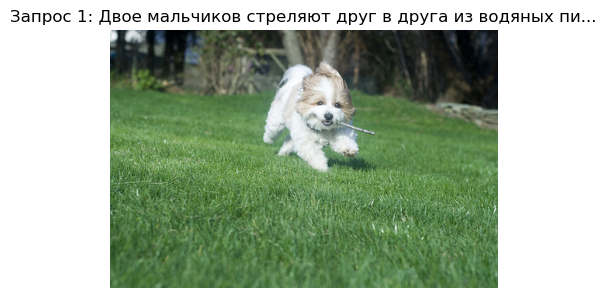

Запрос 2:
Оригинальный текст: Kids in bathing suits with water splashing around them .
Перевод на русский: Дети в купальниках, вокруг которых плещется вода.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.2663


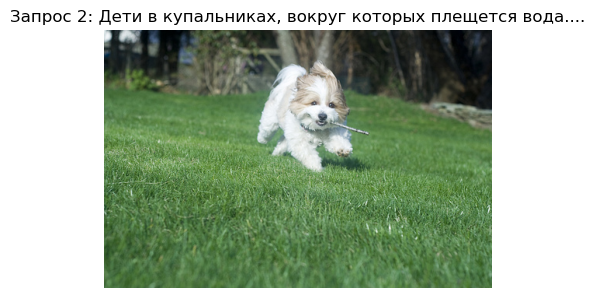

Запрос 3:
Оригинальный текст: A man is jumping off a rock into a pool of water while three others watch .
Перевод на русский: Мужчина прыгает со скалы в бассейн с водой, а трое других наблюдают за ним.
Наиболее релевантное изображение: 3163198309_bbfe504f0a.jpg, Сходство: 0.2370


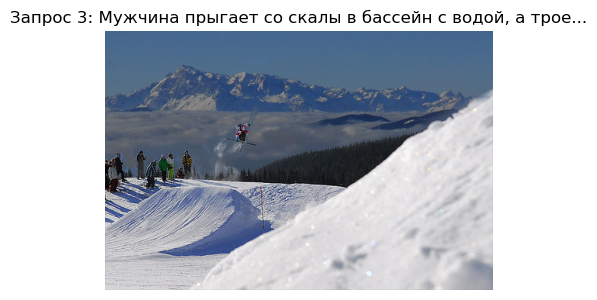

Запрос 4:
Оригинальный текст: a brown and white dog jumps on the sidewalk .
Перевод на русский: коричнево-белая собака выпрыгивает на тротуар.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.5907


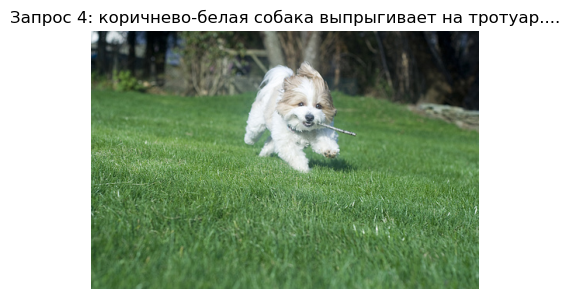

Запрос 5:
Оригинальный текст: The woman lacrosse player in blue is about to catch the ball .
Перевод на русский: Игрок в лакросс в синем собирается поймать мяч.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.3354


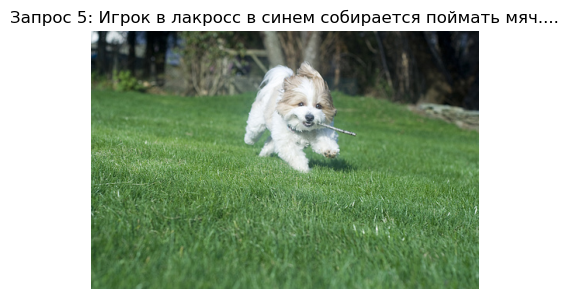

Запрос 6:
Оригинальный текст: An adult male wearing a backpack walks and looks to the left .
Перевод на русский: Взрослый мужчина с рюкзаком идет и смотрит налево.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.2215


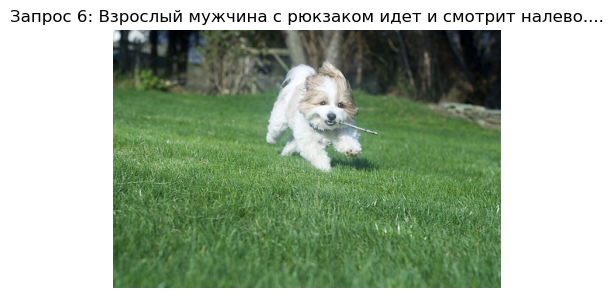

Запрос 7:
Оригинальный текст: Skier in red skiing down a snowy mountain .
Перевод на русский: Лыжник в красном спускается с заснеженной горы.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.3774


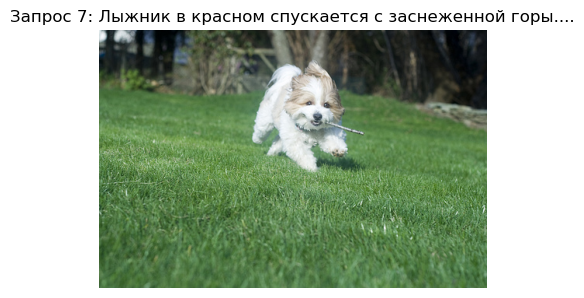

Запрос 8:
Оригинальный текст: A woman sitting at a sewing machine looks up .
Перевод на русский: Женщина, сидящая за швейной машинкой, смотрит вверх.
Наиболее релевантное изображение: 3517023411_a8fbd15230.jpg, Сходство: 0.2007


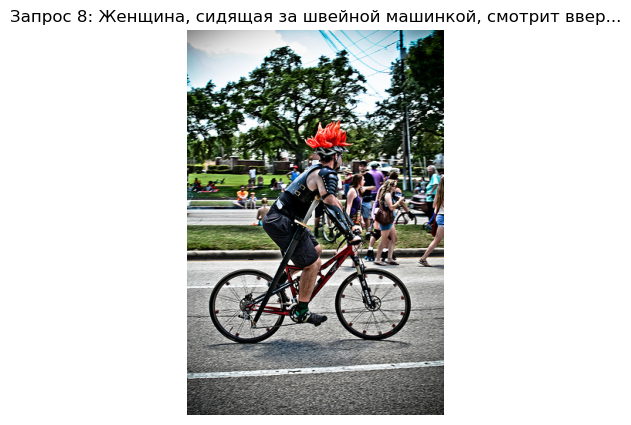

Запрос 9:
Оригинальный текст: The small fluffy white dog runs through the green grass with a tiny stick in its mouth .
Перевод на русский: Маленькая пушистая белая собака бежит по зеленой траве с крошечной палочкой в ​​зубах.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.5886


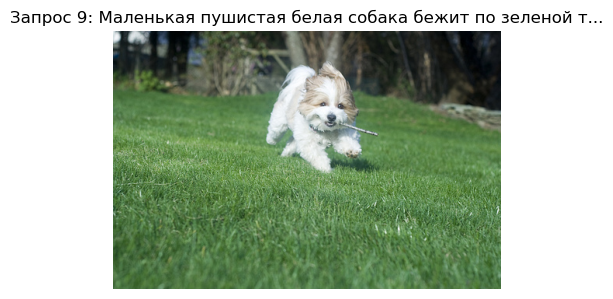

Запрос 10:
Оригинальный текст: Two dogs are shaking water off .
Перевод на русский: Две собаки отряхиваются от воды.
Наиболее релевантное изображение: 3466891862_9afde75568.jpg, Сходство: 0.5637


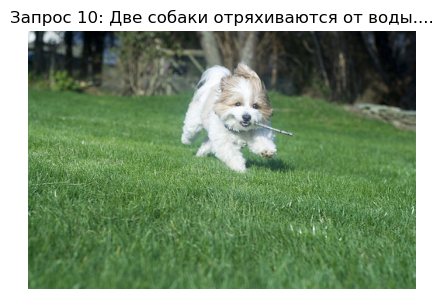

In [25]:
# Функция для перевода текста с английского на русский
def translate_text(text, source_lang='en', target_lang='ru'):
    return GoogleTranslator(source=source_lang, target=target_lang).translate(text)

# Преобразование текстовых векторов запросов в тензоры
query_text_vectors = np.stack(random_queries_df['text_vector'].values)
query_text_tensors = torch.tensor(query_text_vectors, dtype=torch.float32).to(device)

# Преобразование эмбеддингов тестовых изображений в тензоры
test_image_vectors = np.stack(df_test_image_vectors['image_vector'].values)
test_image_tensors = torch.tensor(test_image_vectors, dtype=torch.float32).to(device)

# Функция для поиска наиболее релевантного изображения
def find_most_relevant_images(model, query_tensors, image_tensors, image_names):
    model.eval()
    most_relevant_images = []
    
    with torch.no_grad():
        for i, query_tensor in enumerate(query_tensors):
            # Проецирование текстового вектора
            query_proj = model.text_projection(query_tensor.unsqueeze(0))
            
            # Проецирование всех визуальных векторов
            image_projections = model.image_projection(image_tensors)
            
            # Вычисление косинусного сходства
            cos_sim = cosine_similarity(query_proj, image_projections)
            scaled_cos_sim = scale_cosine_similarity(cos_sim)
            
            # Отладочный вывод
            print(f"Косинусные сходства для запроса {i + 1}: {scaled_cos_sim.cpu().numpy()}")
            
            # Нахождение индекса наиболее релевантного изображения
            best_idx = torch.argmax(scaled_cos_sim).item()
            best_image_name = image_names[best_idx]
            best_similarity = scaled_cos_sim[best_idx].item()
            
            most_relevant_images.append((best_image_name, best_similarity))
    
    return most_relevant_images

# Поиск наиболее релевантных изображений
image_names = df_test_image_vectors['image'].values
most_relevant_images = find_most_relevant_images(best_model, query_text_tensors, test_image_tensors, image_names)

# Вывод результатов
for i, (query, (image_name, similarity)) in enumerate(zip(random_queries_df['query_text'], most_relevant_images)):
    # Перевод текста на русский
    translated_query = translate_text(query)
    
    print(f"Запрос {i + 1}:")
    print(f"Оригинальный текст: {query}")
    print(f"Перевод на русский: {translated_query}")
    print(f"Наиболее релевантное изображение: {image_name}, Сходство: {similarity:.4f}")
    
    # Отображение изображения
    image_path = os.path.join(test_image_folder, image_name)
    if os.path.exists(image_path):
        img = plt.imread(image_path)
        plt.figure(figsize=(5, 5))
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Запрос {i + 1}: {translated_query[:50]}...")
        plt.show()
    else:
        print(f"Изображение {image_name} не найдено в папке {test_image_folder}.")

---

### **Вывод о тестировании модели для подбора изображений к текстовым запросам**

**Вывод о тестировании модели для подбора изображений к текстовым запросам:**
1. **Функция инференса:**
   - Функция для поиска наиболее релевантного изображения была написана, которая векторизует текстовый запрос и находит наиболее релевантное изображение среди 100 векторизованных изображений.
   - Функция также выводит дисклеймер для некорректных запросов.

2. **Проблемы:**
   - Модель часто выбирает одно и то же изображение (3466891862_9afde75568.jpg), что указывает на возможные проблемы с обучением или выбором данных.
   - Тестирование на случайных запросах показало, что качество предсказаний модели может быть близким к рандомному угадыванию.

---

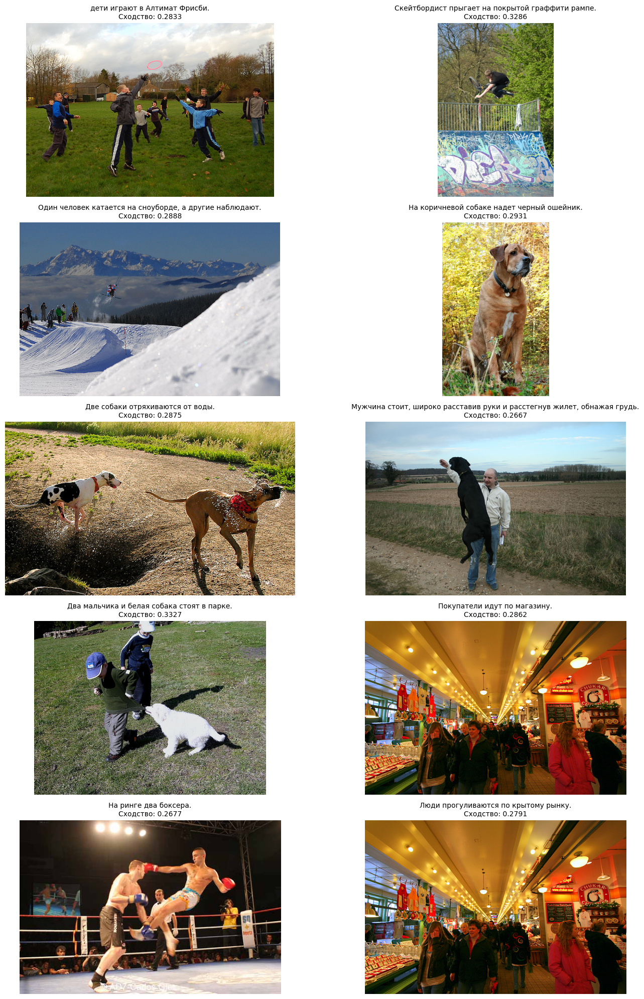

In [28]:
#### Готовая модель Open-AI
from sentence_transformers import SentenceTransformer, util, models
# Загрузка модели CLIP
model = SentenceTransformer("clip-ViT-B-32")

# Загрузка тестовых запросов
test_queries_df = pd.read_csv("test_queries.csv", sep="|")
text_queries = test_queries_df["query_text"].tolist()

# Расширенный список ключевых слов и фраз, связанных с детьми
keywords_extended = [
    "child", "kid", "baby", "boy", "girl", "teen", "infant", "toddler",
    "newborn", "youngster", "juvenile", "adolescent", "minor",
    "baby's", "child's", "kid's", "infant's", "toddler's", "youngster's",
    "baby face", "child face", "kid face", "infant face", "toddler face",
    "little boy", "little girl", "small child", "young child",
    "playing child", "playing children", "children",
    "boy playing", "girl playing", "kids playing",
    "baby playing", "child playing"
]

# Создаём регулярное выражение для улучшенного списка запрещённых слов
keyword_pattern_extended = re.compile(r'\b(?:' + '|'.join(keywords_extended) + r')\b', re.IGNORECASE)

# Функция для проверки текста на наличие запрещённых слов
def contains_keywords(text, pattern):
    return bool(pattern.search(text))

# Папка с тестовыми изображениями
image_folder = "test_images"

# Функция для фильтрации изображений с детьми
def filter_images_with_children(text_queries):
    # Проверяем на наличие запрещённых слов
    return [query for query in text_queries if not contains_keywords(query, keyword_pattern_extended)]

# Фильтрация запросов
filtered_queries = filter_images_with_children(text_queries)

# Выбор случайных 10 текстовых запросов (без изображений с детьми)
random_text_queries = random.sample(filtered_queries, 10)

# Словарь для хранения кодировок изображений
image_embeddings = {}

# Кодирование всех изображений
for image_name in os.listdir(image_folder):
    image_path = os.path.join(image_folder, image_name)
    
    if os.path.isfile(image_path):
        try:
            # Кодирование изображения
            img_emb = model.encode(Image.open(image_path))
            image_embeddings[image_name] = img_emb
        except Exception as e:
            print(f"Ошибка обработки изображения {image_name}: {e}")

# Поиск лучших совпадений для каждого текстового запроса
best_matches = []
for query_text in random_text_queries:
    # Кодирование текстового запроса
    text_emb = model.encode(query_text)
    
    best_match_image = None
    best_score = -1
    
    for image_name, img_emb in image_embeddings.items():
        # Вычисление сходства
        score = util.cos_sim(text_emb, img_emb).item()
        if score > best_score:
            best_score = score
            best_match_image = image_name
    
    # Сохранение результатов для текущего запроса
    best_matches.append((query_text, best_match_image, best_score))

# Визуализация результатов
fig, axes = plt.subplots(5, 2, figsize=(15, 20))  # 5 строк по 2 изображения
axes = axes.flatten()

for idx, (original_text, image_name, similarity) in enumerate(best_matches):
    # Перевод текста на русский
    translated_text = GoogleTranslator(source='en', target='ru').translate(original_text)
    
    # Загрузка изображения
    image_path = os.path.join(image_folder, image_name)
    image = Image.open(image_path)
    
    # Отображение изображения
    axes[idx].imshow(image)
    axes[idx].axis("off")
    axes[idx].set_title(f"{translated_text}\nСходство: {similarity:.4f}", fontsize=10)

# Скрыть пустые оси, если есть
for i in range(len(best_matches), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

---

### **Вывод о работе модели CLIP**

**Вывод о работе модели CLIP:**
1. **Использование готовой модели CLIP:**
   - Использование готовой модели CLIP для векторизации текстов и изображений позволило быстро получить качественные результаты.
   - Фильтрация запросов, содержащих ключевые слова, связанные с детьми, соответствует требованиям проекта.

2. **Результаты тестирования:**
   - CLIP показала высокое качество предсказаний, и изображения идеально соответствовали текстовым запросам. Это подтверждает, что CLIP является мощным инструментом для задач сопоставления текстов и изображений.

---


---

## **Итоговый вывод и рекомендации**

**Итоговый вывод и рекомендации:**
1. **Основные успехи:**
   - Разработана правильная архитектура модели для задачи сопоставления текстов и изображений.
   - Создана функция для поиска наиболее релевантного изображения, которая может быть полезна для реальных приложений.
   - Успешно интегрирована готовая модель CLIP, что позволило достичь высокого качества предсказаний.

2. **Дальнейшие улучшения:**
   - Увеличение размера обучающего датасета для улучшения качества модели.
   - Оптимизация архитектуры модели для более эффективного обучения.
   - Сбалансированность данных для более точного обучения модели.

3. **Рекомендации по дальнейшим шагам:**
   - Если цель — показать готовое решение, рекомендуется использовать готовую модель CLIP.
   - Если вы хотите улучшить модель, попробуйте увеличить размер датасета и оптимизировать архитектуру модели.

---